# Skin Type Recognition

In [1]:
# downloading helper_functions.py
! wget https://raw.githubusercontent.com/Hrushi11/Dogs_VS_Cats/main/helper_functions.py

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [1]:
import requests

url = "https://raw.githubusercontent.com/Hrushi11/Dogs_VS_Cats/main/helper_functions.py"
response = requests.get(url)

with open("helper_functions.py", "wb") as file:
    file.write(response.content)


In [2]:
pip install requests

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable


In [5]:
!pip uninstall tensorflow

In [10]:
!pip show tensorflow

Name: tensorflow
Version: 2.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: C:\Users\junsu\AppData\Roaming\Python\Python311\site-packages
Requires: tensorflow-intel
Required-by: 


In [4]:
# Importing dependancies
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from helper_functions import plot_loss_curves, compare_historys, make_confusion_matrix

In [5]:
# Setting dir paths
oil_dir = "C:/Users//Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset/oily"
dry_dir = "C:/Users//Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset/dry"

In [11]:
# Getting all the paths in a list for oil and dry skins
oil_list = []
for path in os.listdir(oil_dir):
  oil_list.append(oil_dir + "/" + path)

dry_list = []
for path in os.listdir(dry_dir):
  dry_list.append(dry_dir + "/" + path)

In [12]:
# Preprocess img function
IMG_SIZE = (224, 224)
def load_and_prep(filepath):
  img_path = tf.io.read_file(filepath)
  img = tf.io.decode_image(img_path)
  img = tf.image.resize(img, IMG_SIZE)

  return img

In [13]:
# Getting only those images which are suitable 
def corrImgs(arr):
  corrImgList = []
  for path in arr:
    img = load_and_prep(path)
    if (img.shape[2] == 3) | (img.shape == 4):
      corrImgList.append(path)
  
  return corrImgList

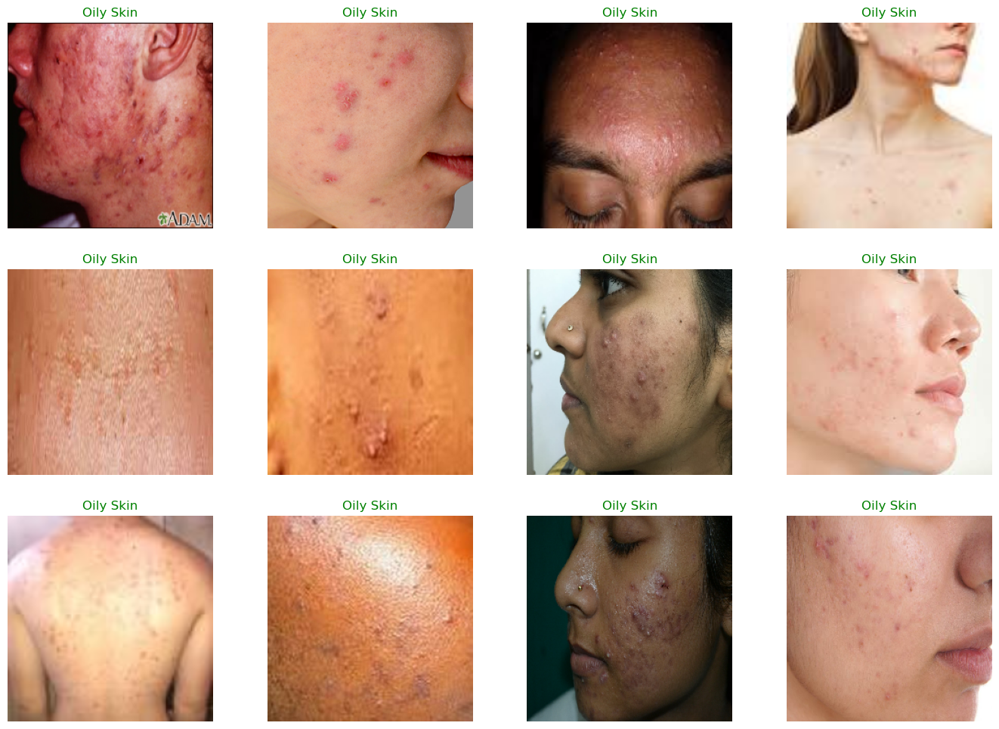

In [14]:
# Randomly plotting the Oily Skin images
random_oil_skin = np.random.choice(oil_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_oil_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Oily Skin", color="green")

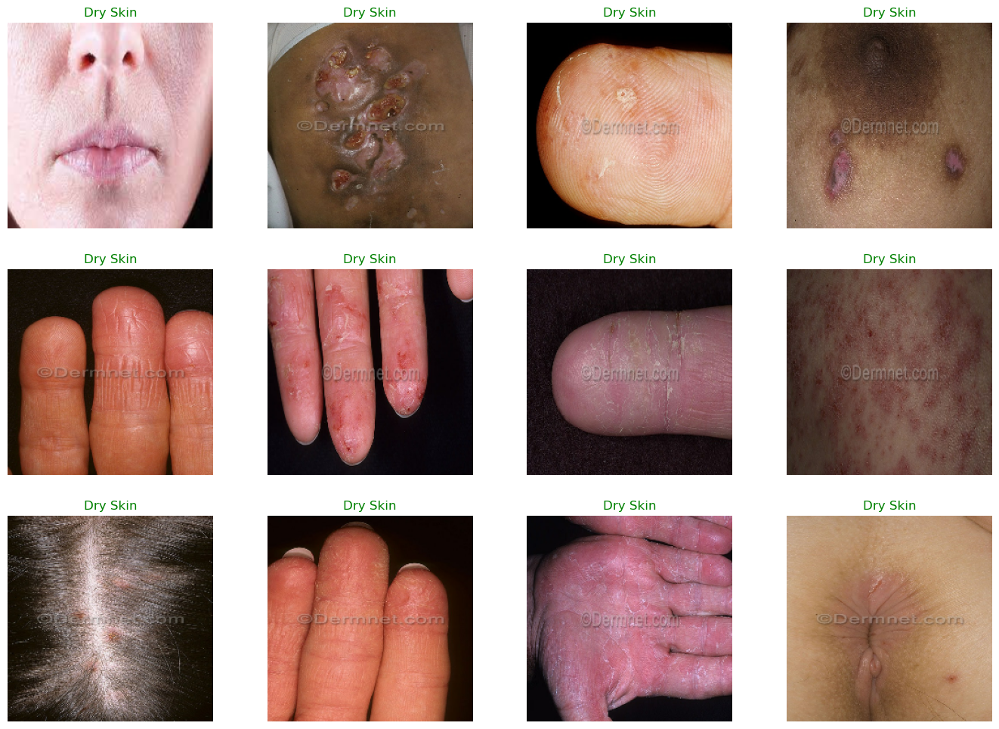

In [15]:
# Randomly plotting the Dry Skin images
random_dry_skin = np.random.choice(dry_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_dry_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Dry Skin", color="green")

In [11]:
# Creating data augmentation layer
data_augmentation = tf.keras.Sequential([
   preprocessing.RandomFlip("horizontal"),
   preprocessing.RandomRotation(0.2),
   preprocessing.RandomZoom(0.2),
   preprocessing.RandomHeight(0.2),
  preprocessing.RandomWidth(0.2)
], name="data_augmentation_layer")

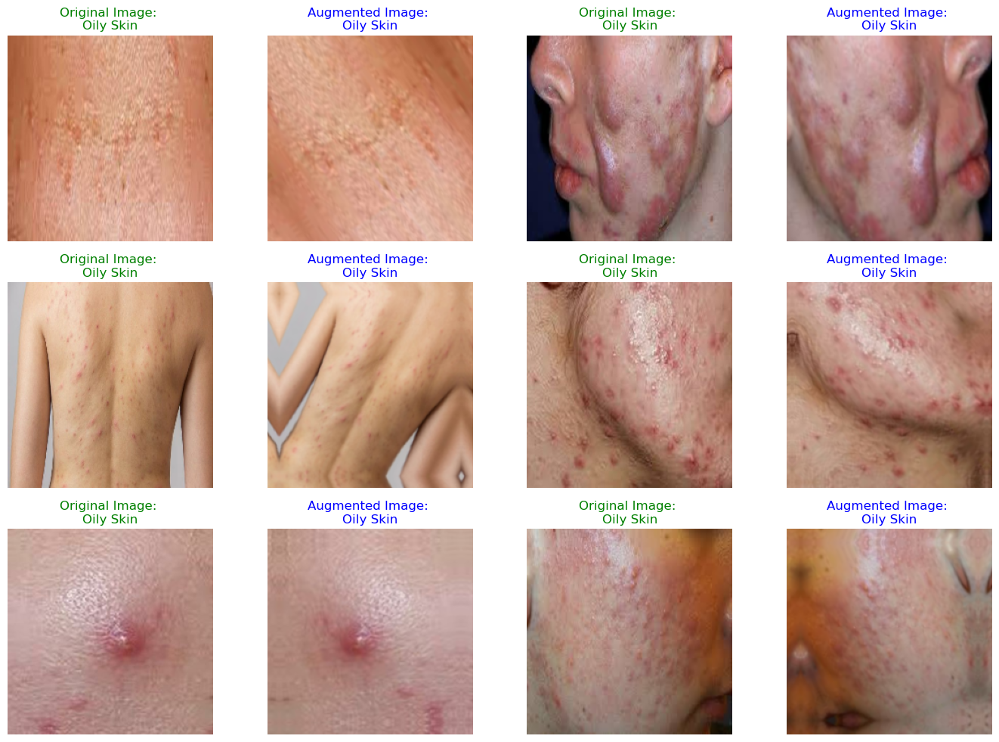

In [12]:
# Visualizing multiple randomly augmented oily skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Oily Skin"
  random_img_path = random.choice(oil_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

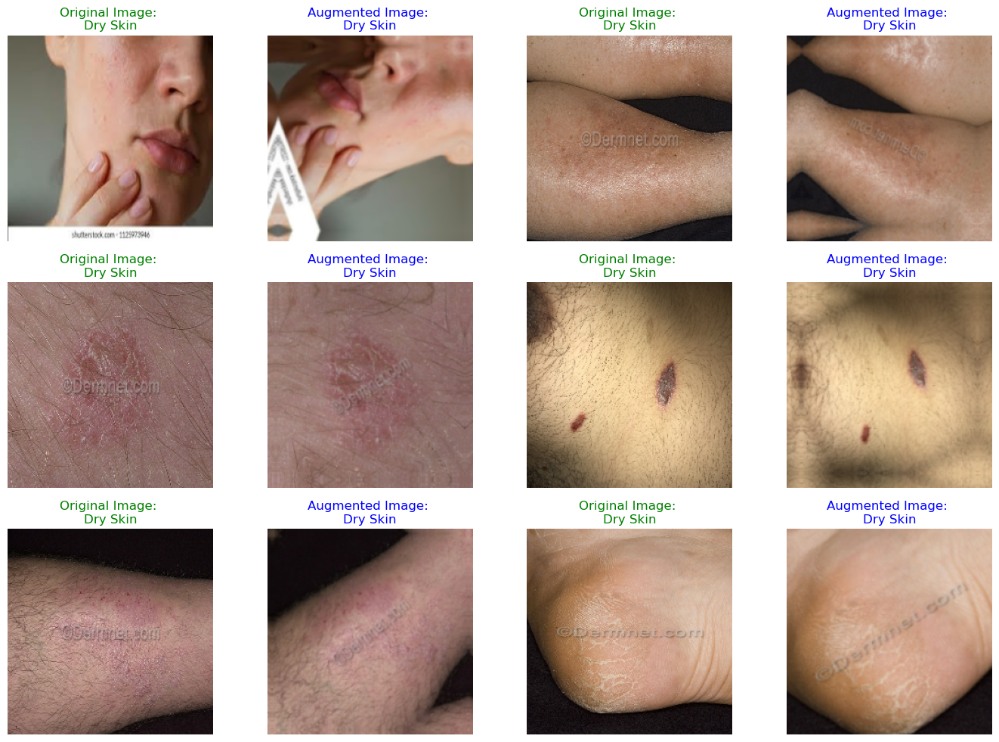

In [13]:
# Visualizing multiple randomly augmented dry skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Dry Skin"
  random_img_path = random.choice(dry_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

In [15]:
# Train test splits
data_gen = ImageDataGenerator(validation_split=0.2)

train_data = data_gen.flow_from_directory(directory="C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset",
                                          subset='training',
                                          target_size=IMG_SIZE)
# test_data = data_gen.flow_from_directory(directory="/content/drive/MyDrive/skin-dataset",
test_data = data_gen.flow_from_directory(directory="C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset",
                                         subset='validation',
                                         target_size=IMG_SIZE)

Found 412 images belonging to 2 classes.
Found 102 images belonging to 2 classes.


In [78]:
test_data.filepaths

['C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\dry\\dry(111).jpg',
 'C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\oily\\oily(103).JPG',
 'C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\dry\\dry(153).jpg',
 'C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\dry\\dry(105).jpg',
 'C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\dry\\dry(121).jpg',
 'C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\dry\\dry(150).jpg',
 'C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\dry\\dry(172).jpg',
 'C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\oily\\oily(10).jpg',
 'C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset\\dry\\dry(125).jpg'

## Building the Model

In [17]:
# Setting up base model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setting up input layer
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling")(x) 
outputs = tf.keras.layers.Dense(2, activation="softmax", name="output_layer")(x) 
model_1 = tf.keras.Model(inputs, outputs)

# compiling the model
model_1.compile(loss=tf.keras.losses.categorical_crossentropy,
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# fit the model
history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=0.25 * len(test_data))


Epoch 1/5


13/13 [==============================] - 46s 2s/step - loss: 0.5033 - accuracy: 0.7476 - val_loss: 0.5231 - val_accuracy: 0.6250
Epoch 2/5
13/13 [==============================] - 22s 2s/step - loss: 0.3290 - accuracy: 0.8738 - val_loss: 0.2352 - val_accuracy: 0.9375
Epoch 3/5
13/13 [==============================] - 21s 2s/step - loss: 0.2438 - accuracy: 0.9345 - val_loss: 0.1263 - val_accuracy: 1.0000
Epoch 4/5
13/13 [==============================] - 21s 2s/step - loss: 0.2007 - accuracy: 0.9296 - val_loss: 0.1593 - val_accuracy: 0.9688
Epoch 5/5
13/13 [==============================] - 21s 2s/step - loss: 0.1827 - accuracy: 0.9393 - val_loss: 0.2202 - val_accuracy: 0.9375


In [18]:
# Evaluating the model
model_1.evaluate(test_data)

4/4 [==============================] - 5s 1s/step - loss: 0.1714 - accuracy: 0.9510


[0.1713617891073227, 0.9509803652763367]

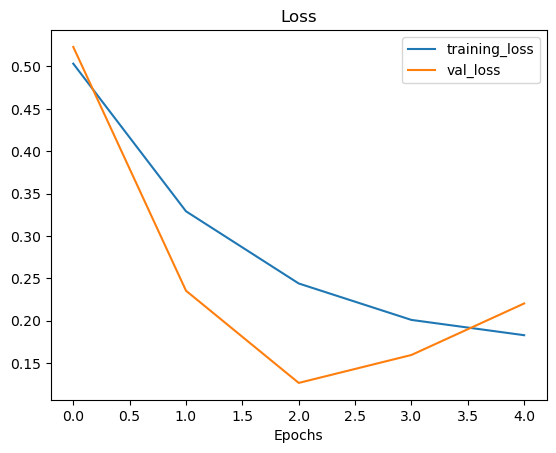

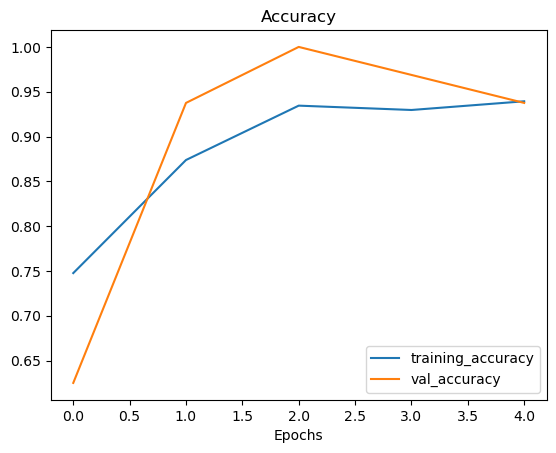

In [19]:
# Plotting loss curves
plot_loss_curves(history_1)

In [20]:
# Saving the model 
model_1.save("/content/drive/MyDrive/Skin-Type-Recognition", save_format="h5")

C:\Users\junsu\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [23]:
# Model summary
model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, None   0         
 equential)                  )                                   
                                                                 
 efficientnetb0 (Functional  (None, None, None, 1280   4049571   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 2)                 2562      
                                                             

In [82]:
# Getting test image file paths
test_data_img_paths = test_data.filepaths
np.random.shuffle(test_data_img_paths)

# Getting labels
test_data_labels = []
for path in test_data_img_paths:
    
    test_data_labels.append(path.split("\\")[-2])

# Creating a dataframe of test paths
df_test_data_img_paths = pd.DataFrame({"Img Paths": test_data_img_paths,
                                       "Labels": test_data_labels})

df_test_data_img_paths.head()

,Img Paths,Labels
0,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry
1,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry
2,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry
3,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry
4,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,oily


In [83]:
len(df_test_data_img_paths)

102

In [84]:
# Generating a test dataset for 
test_data_shuff = data_gen.flow_from_dataframe(df_test_data_img_paths, 
                                               directory="C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/skin-dataset", 
                                               x_col='Img Paths', y_col='Labels',
                                               shuffle=False,
                                               target_size=(224, 224))

Found 102 validated image filenames belonging to 2 classes.


In [85]:
# Loading the model
# The same model architecture was trained on tensorflow==2.3.0 and then loaded here, trained on Tesla-K80
# C:\Users\junsu\Real-TIme-Skin-Type-Detection\Real-TIme-Skin-Type-Detection\Skin-Type-Recognition-Degraded
model = tf.keras.models.load_model("C:/Users/junsu/Real-TIme-Skin-Type-Detection/Real-TIme-Skin-Type-Detection/Skin-Type-Recognition-Degraded")

In [86]:
# Getting prediction probabilites
pred_prob = model.predict(test_data_shuff)
pred_prob[:20]

4/4 [==============================] - 7s 684ms/step


array([[9.7962153e-01, 2.0378463e-02],
       [9.9946600e-01, 5.3400116e-04],
       [9.9981099e-01, 1.8901883e-04],
       [9.9750501e-01, 2.4950353e-03],
       [3.4770641e-01, 6.5229362e-01],
       [9.7444791e-01, 2.5552083e-02],
       [9.9738103e-01, 2.6189389e-03],
       [9.9909520e-01, 9.0478978e-04],
       [9.9537969e-01, 4.6203379e-03],
       [9.9949253e-01, 5.0750858e-04],
       [1.8948944e-01, 8.1051058e-01],
       [4.0354586e-01, 5.9645420e-01],
       [9.8444760e-01, 1.5552421e-02],
       [4.9382529e-01, 5.0617468e-01],
       [9.9727696e-01, 2.7229968e-03],
       [7.1167988e-01, 2.8832012e-01],
       [1.5316536e-01, 8.4683460e-01],
       [9.9966586e-01, 3.3417126e-04],
       [9.9903381e-01, 9.6625439e-04],
       [9.9906558e-01, 9.3438372e-04]], dtype=float32)

In [87]:
y_pred = pred_prob.argmax(axis=1)
y_pred[:20]

array([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0],
      dtype=int64)

In [88]:
# Labels 
test_data.class_indices

{'dry': 0, 'oily': 1}

In [90]:
# Converting our text labels into numbers
y_true = []
for label in test_data_labels:
  label_ = 0 if label == "dry" else 1
  y_true.append(label_)

y_true  = np.array(y_true)
y_true[:20]

array([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0])

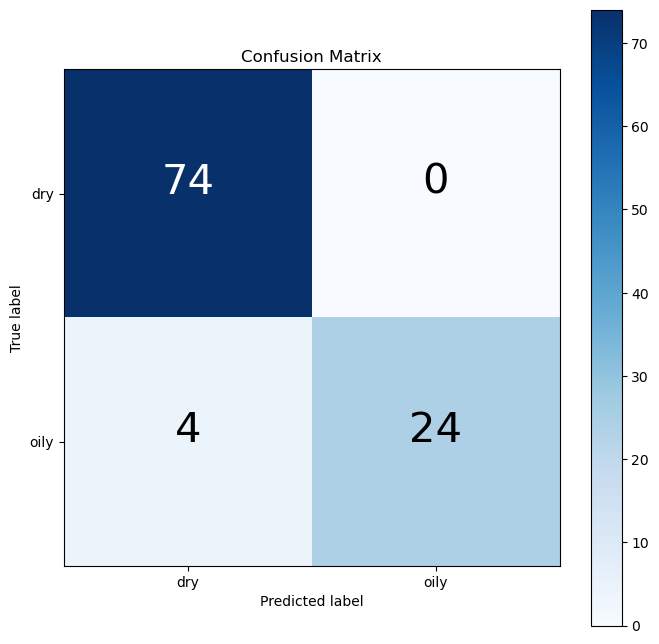

In [91]:
# Plotting a confusion matrix
class_names = ["dry", "oily"]

make_confusion_matrix(y_true=y_true,
                      y_pred=y_pred,
                      classes=class_names,
                      figsize=(8, 8),
                      text_size=30,
                      norm=False)

In [92]:
# To get suitable images
corrImgList = corrImgs(test_data_img_paths)

1/1 [==============================] - 0s 140ms/step


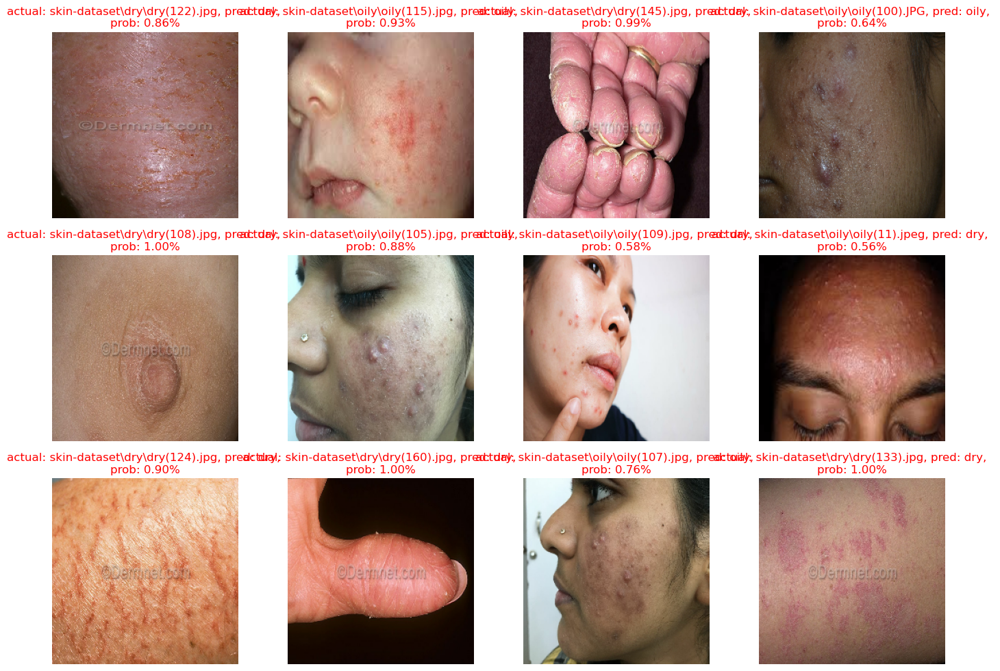

In [93]:
path_list = np.random.choice(corrImgList, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = path_list[i]
  class_name = img_path.split("/")[5]
  img = load_and_prep(img_path)

  pred_prob  = model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);

In [94]:
# Getting test labels
test_labels = []
for path in test_data_img_paths:
  test_labels.append(path.split("\\")[-2])

test_labels[:5]

['dry', 'dry', 'dry', 'dry', 'oily']

In [95]:
df_pred = pd.DataFrame({"filename" : test_data_img_paths,
                         "label": test_labels,
                         "True": y_true,
                         "pred": y_pred})

df_pred.head(10)

,filename,label,True,pred
0,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0
1,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0
2,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0
3,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0
4,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,oily,1,1
5,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0
6,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0
7,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0
8,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0
9,C:/Users/junsu/Real-TIme-Skin-Type-Detection/R...,dry,0,0


In [96]:
df_pred.to_csv("test-preds.csv")

In [97]:
len(test_data_img_paths)

102

In [98]:
# Wrong predicted images
wrng_pred_test_paths = []
for i in range(len(test_data_img_paths)):
  if y_true[i] != y_pred[i]:
    wrng_pred_test_paths.append(test_data_img_paths[i])

len(wrng_pred_test_paths)

4

1/1 [==============================] - 0s 153ms/step


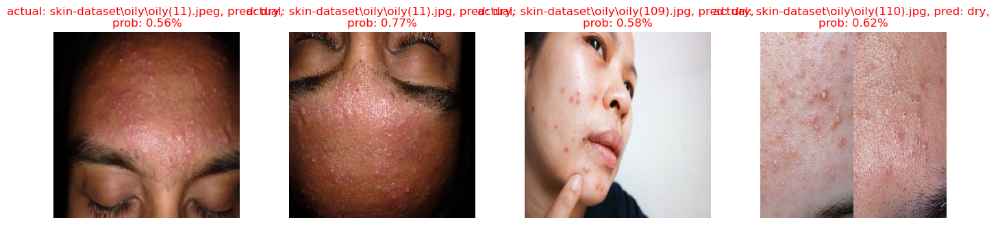

In [99]:
# Wrongly predicted images
plt.figure(figsize=(17, 12))
for i in range(4):
  img_path = wrng_pred_test_paths[i]
  class_name = img_path.split("/")[5]
  img = load_and_prep(img_path)

  pred_prob  = model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);